# Import Required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style='darkgrid', font_scale=1.4)
import itertools
import plotly.express as px

# importing stacking lib
from vecstack import stacking

import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [2]:
import mplcyberpunk
plt.style.use("cyberpunk")

---

# Load Data

In [3]:
data="melb_data.csv"

In [4]:
df=pd.read_csv(data)
original_df=df
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


---

# Data Analysis Summary

In [5]:
df.shape

(13580, 21)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
Suburb           13580 non-null object
Address          13580 non-null object
Rooms            13580 non-null int64
Type             13580 non-null object
Price            13580 non-null float64
Method           13580 non-null object
SellerG          13580 non-null object
Date             13580 non-null object
Distance         13580 non-null float64
Postcode         13580 non-null float64
Bedroom2         13580 non-null float64
Bathroom         13580 non-null float64
Car              13518 non-null float64
Landsize         13580 non-null float64
BuildingArea     7130 non-null float64
YearBuilt        8205 non-null float64
CouncilArea      12211 non-null object
Lattitude        13580 non-null float64
Longtitude       13580 non-null float64
Regionname       13580 non-null object
Propertycount    13580 non-null float64
dtypes: float64(12), int64(1), object(8)
memory usage: 2.2+ MB


### Numeric Data Descriptive Analysis

In [7]:
orig_desc = df.describe()
orig_desc

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


#### Generate Numerical data

In [8]:
num_feat=df.select_dtypes(exclude='object')
num_feat.head()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
0,2,1480000.0,2.5,3067.0,2.0,1.0,1.0,202.0,NaN,NaN,-37.7996,144.9984,4019.0
1,2,1035000.0,2.5,3067.0,2.0,1.0,0.0,156.0,79.0,1900.0,-37.8079,144.9934,4019.0
2,3,1465000.0,2.5,3067.0,3.0,2.0,0.0,134.0,150.0,1900.0,-37.8093,144.9944,4019.0
3,3,850000.0,2.5,3067.0,3.0,2.0,1.0,94.0,NaN,NaN,-37.7969,144.9969,4019.0
4,4,1600000.0,2.5,3067.0,3.0,1.0,2.0,120.0,142.0,2014.0,-37.8072,144.9941,4019.0


### Categorical Data Descriptive Analysis

In [9]:
df.describe(include=['O'])

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,58,33,8
top,Reservoir,5 Charles St,h,S,Nelson,27/05/2017,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,473,1163,4695


#### Generate Categorical data

In [10]:
cat_feat=df.select_dtypes(include='object')
cat_feat.head()

,Suburb,Address,Type,Method,SellerG,Date,CouncilArea,Regionname
0,Abbotsford,85 Turner St,h,S,Biggin,3/12/2016,Yarra,Northern Metropolitan
1,Abbotsford,25 Bloomburg St,h,S,Biggin,4/02/2016,Yarra,Northern Metropolitan
2,Abbotsford,5 Charles St,h,SP,Biggin,4/03/2017,Yarra,Northern Metropolitan
3,Abbotsford,40 Federation La,h,PI,Biggin,4/03/2017,Yarra,Northern Metropolitan
4,Abbotsford,55a Park St,h,VB,Nelson,4/06/2016,Yarra,Northern Metropolitan


### Check for Null and Duplicates values

In [11]:
df.isnull().sum()

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64

In [12]:
df.duplicated().sum()

0

---

# Exploratory Data Analysis (EDA)

When analyzing a dataset with the given columns, you can ask various questions to gain insights and understand the properties in the dataset. Here are some potential questions you can explore:

1. **What is the distribution of property prices?**
   - Analyze the `Price` column to understand the range, mean, median, and spread of property prices.
   - Identify any outliers or unusual patterns in the price distribution.

In [13]:
print('Mean Price', df['Price'].mean())
print('Median Price', df['Price'].median())
print('Mode Price', df['Price'].mode())

Mean Price 1075684.079455081
Median Price 903000.0
Mode Price 0    1100000.0
dtype: float64


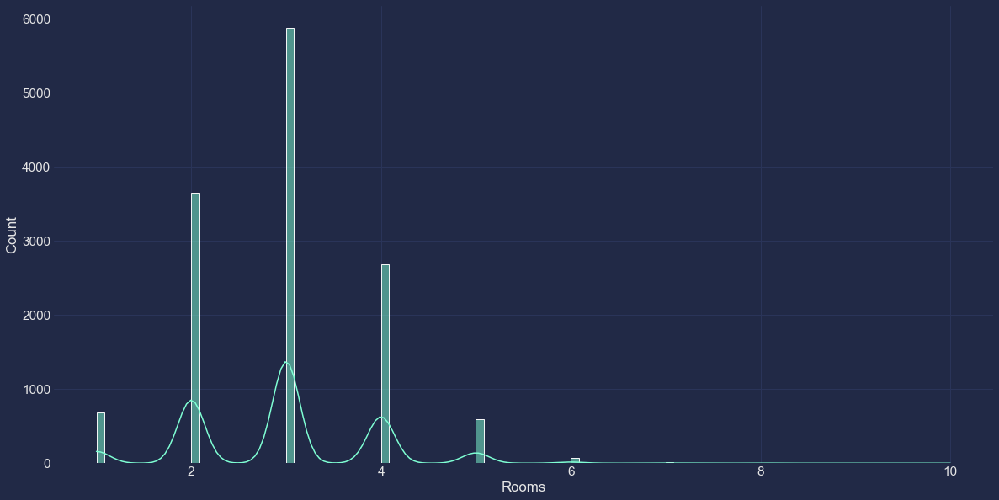

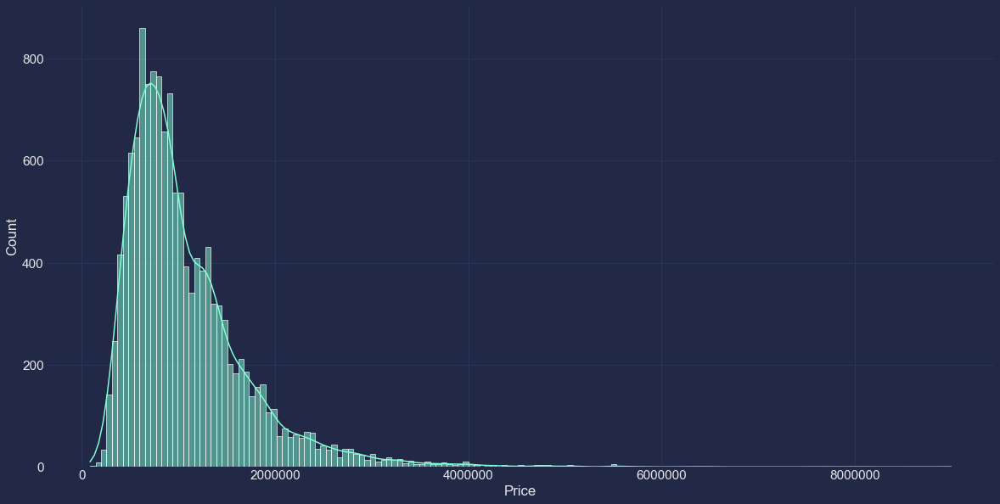

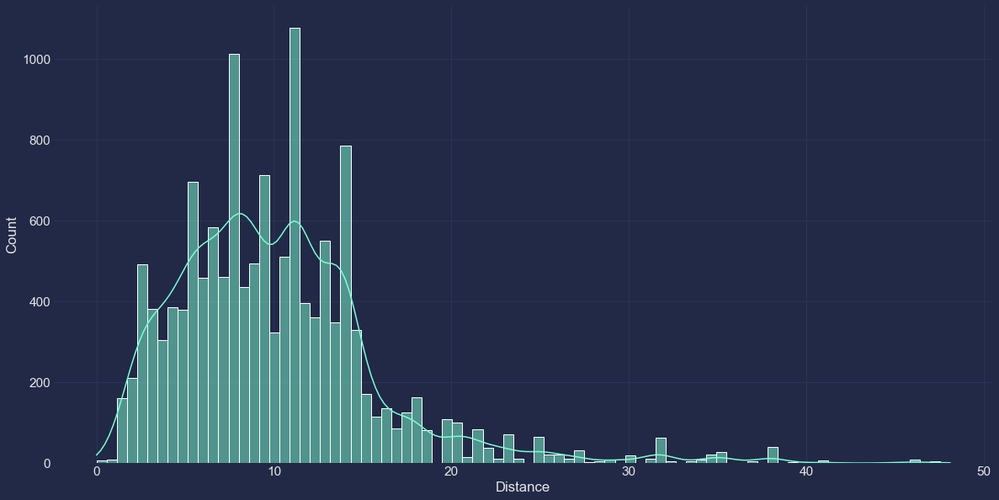

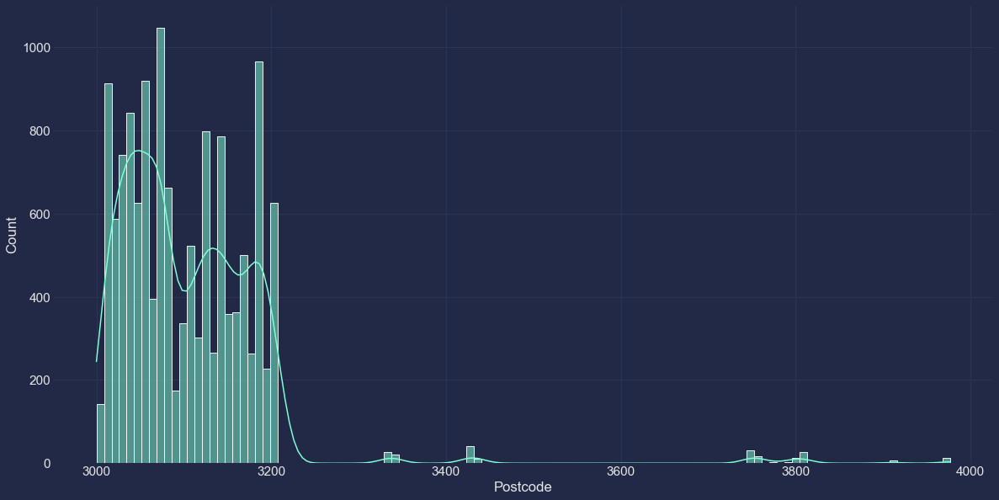

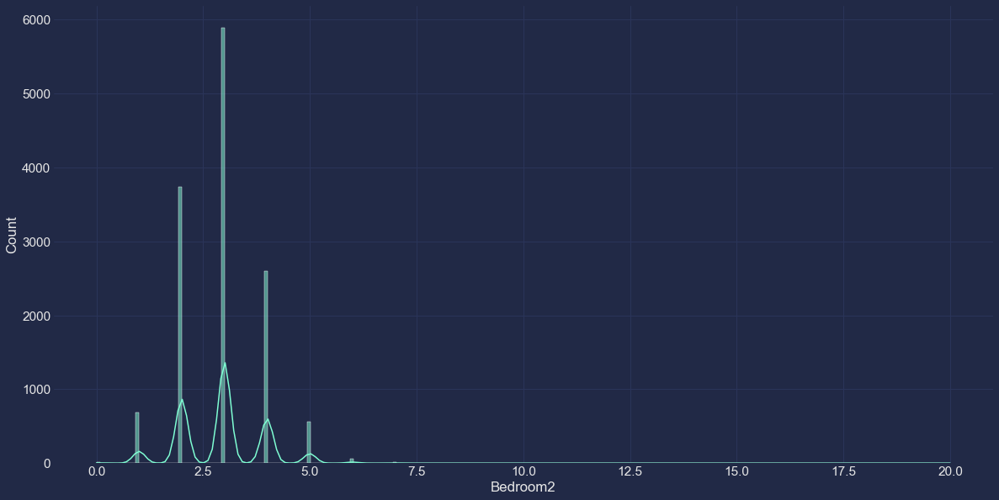

...

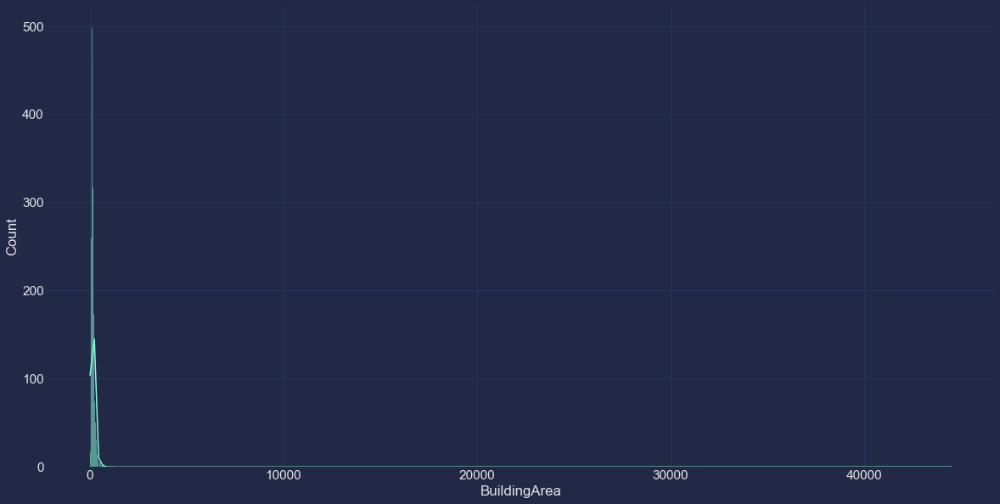

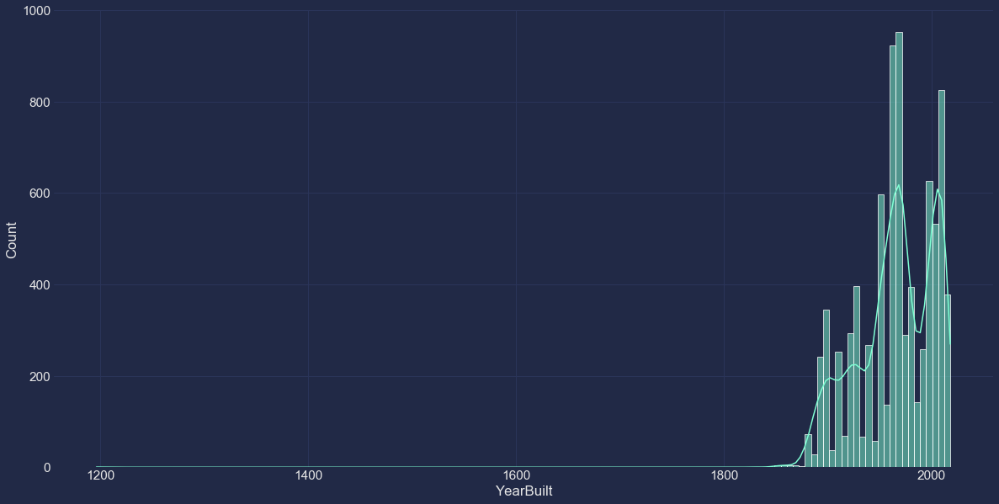

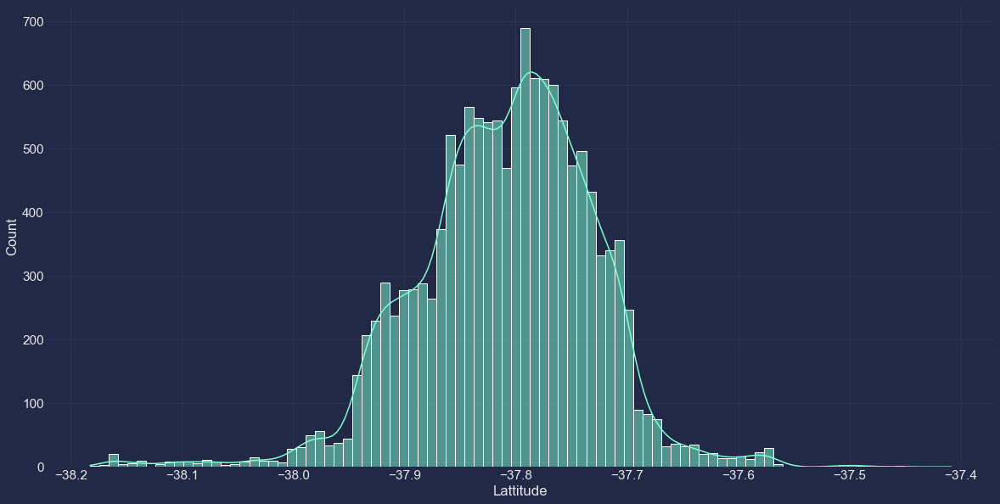

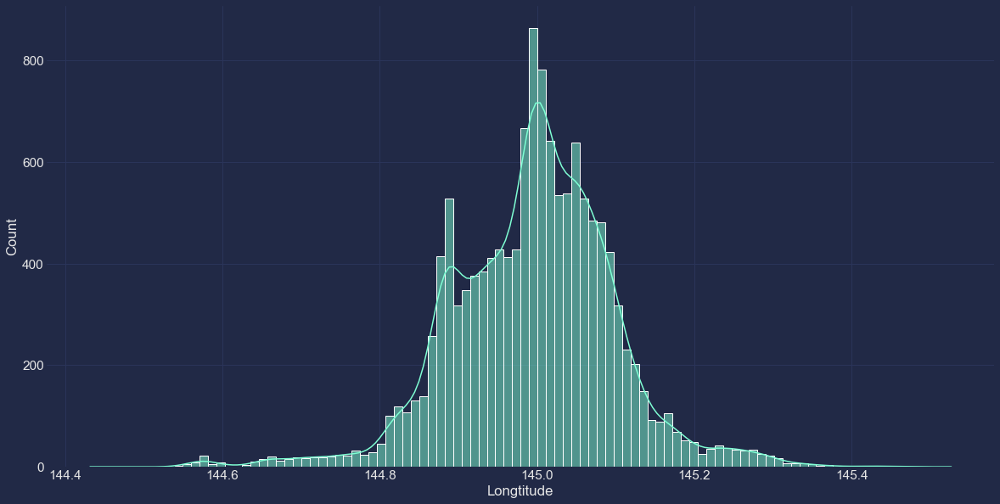

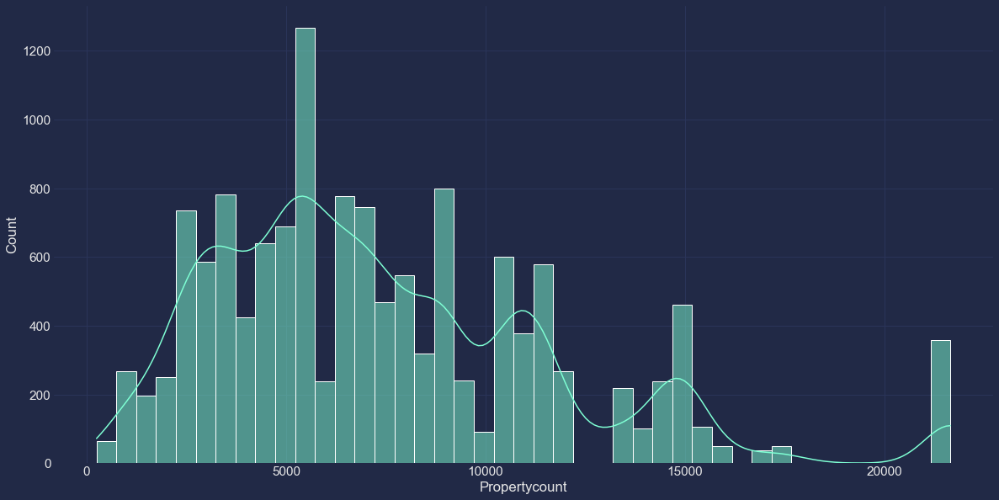

In [14]:
for i in num_feat.columns:
    plt.figure(figsize=(20,10))
    sns.histplot(num_feat[i], kde=True, color='aquamarine')
    plt.xlabel(i)
    plt.show()

**Insight:**

The price, Distance distribution is Right skewedness.

---

2. **How does the number of rooms (`Rooms`) relate to property prices (`Price`)?**
   - Explore the relationship between the number of rooms and the property prices.
   - Determine if there is a positive correlation between the two variables.

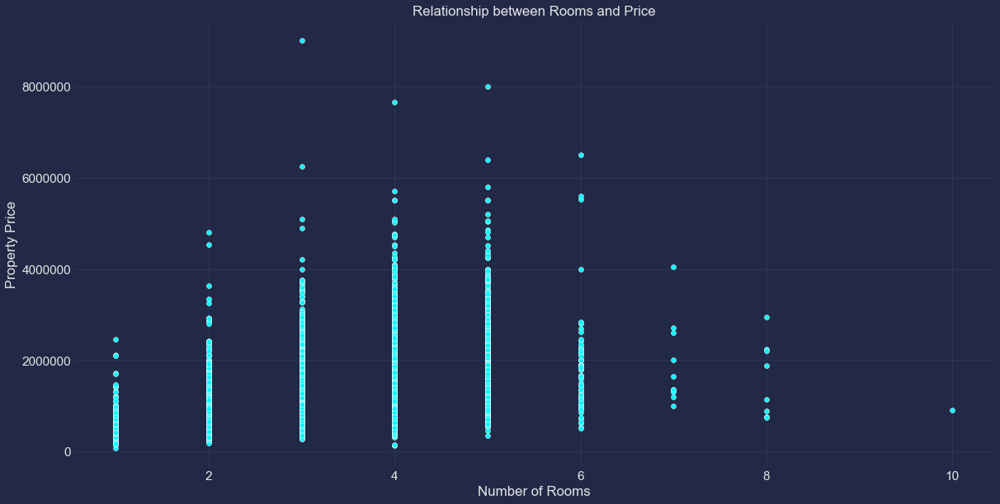

Correlation Coefficient:  0.49663367618653004


In [15]:
plt.figure(figsize=(20,10))

sns.scatterplot(data=df, x='Rooms', y='Price')
plt.xlabel('Number of Rooms')
plt.ylabel('Property Price')
plt.title('Relationship between Rooms and Price')
plt.show()

# Calculate the correlation coefficient
correlation = df['Rooms'].corr(df['Price'])
print("Correlation Coefficient: ", correlation)

---

3. **What are the different types of properties (`Type`) in the dataset?**
   - Identify the unique property types and their respective frequencies.
   - Analyze how the property type affects the prices and other attributes.

Type Frequency is:
 h    9449
u    3017
t    1114
Name: Type, dtype: int64


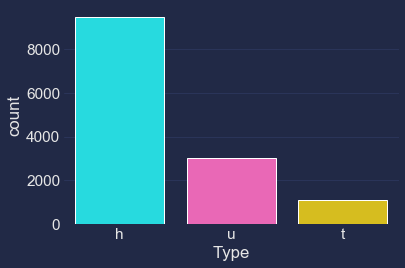

In [16]:
sns.countplot(df['Type'])

print('Type Frequency is:\n', df['Type'].value_counts())

Text(0.5, 1.0, 'Method vs Price Distribution')

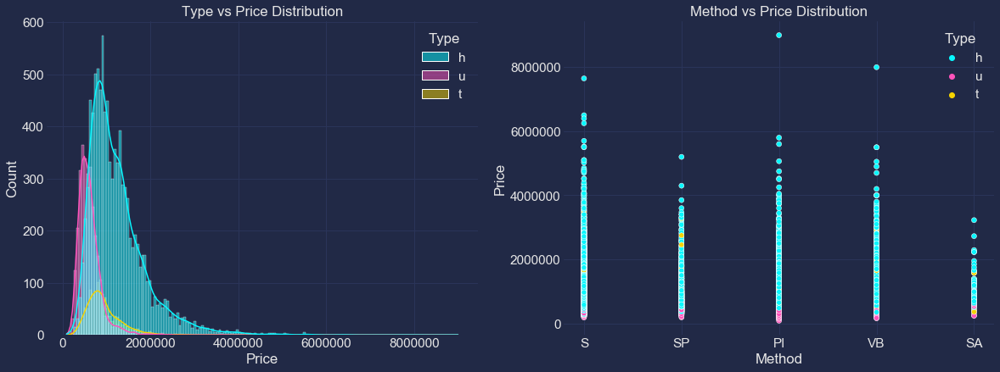

In [17]:
fig=plt.figure(figsize=(20,15))

plt.subplot(2, 2,1)
sns.histplot(data=df, x='Price', hue='Type', kde=True)
plt.title('Type vs Price Distribution')

plt.subplot(2, 2, 2)
sns.scatterplot(x='Method', y='Price', hue='Type', data=df)
plt.title('Method vs Price Distribution')

---

4. **Which suburbs (`Suburb`) have the highest property prices?**
   - Determine the suburbs with the most expensive properties.
   - Visualize the distribution of property prices across different suburbs.

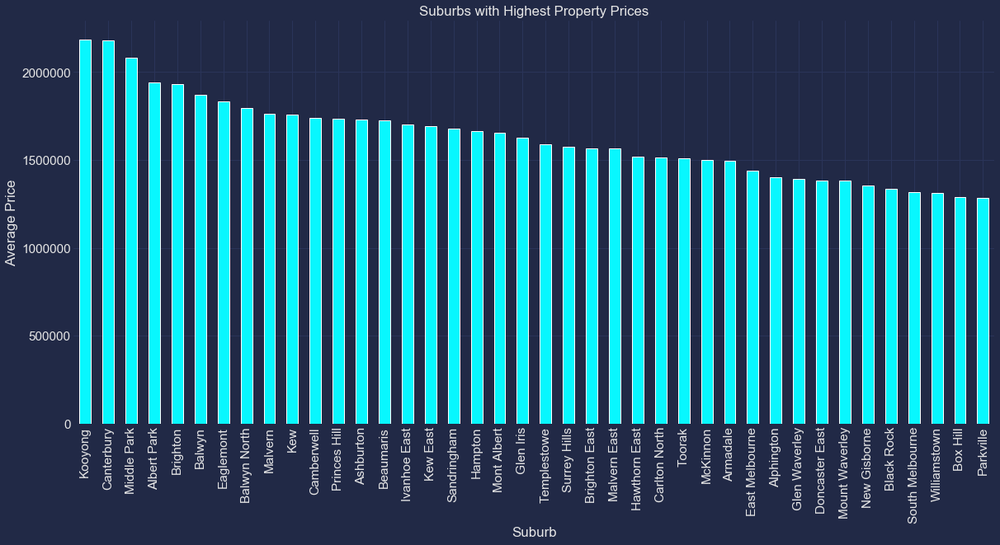

In [18]:
# Group by Suburb and calculate average property prices
suburb_prices = df.groupby('Suburb')['Price'].mean().nlargest(40)  # Adjust '10' to the desired number of suburbs to display

# Plot the suburb prices
plt.figure(figsize=(20, 9))
suburb_prices.plot(kind='bar')
plt.xlabel('Suburb')
plt.ylabel('Average Price')
plt.title('Suburbs with Highest Property Prices')
plt.xticks(rotation=90)
plt.show()


---

5. **Are there any temporal trends in property prices (`Price`) over time (`Date`)?**
   - Analyze how property prices change over different dates or time periods.
   - Identify any seasonal or long-term trends in the data.

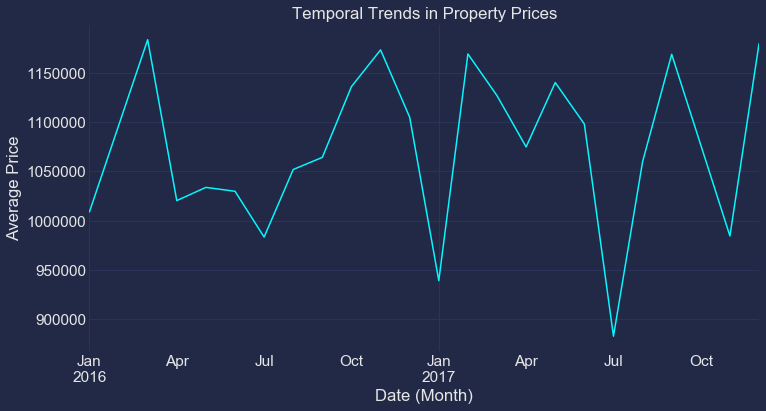

In [19]:
# Convert 'Date' column to DateTime format
df['Date'] = pd.to_datetime(df['Date'])

# Group by month and calculate average property prices
monthly_prices = df.groupby(df['Date'].dt.to_period('M'))['Price'].mean()

# Plot the time series of property prices
plt.figure(figsize=(12, 6))
monthly_prices.plot()
plt.xlabel('Date (Month)')
plt.ylabel('Average Price')
plt.title('Temporal Trends in Property Prices')
plt.show()


---

6. **What is the average land size (`Landsize`) and building area (`BuildingArea`) for different property types?**
   - Compare the average land size and building area among different property types.
   - Identify any variations or trends in the sizes of properties.

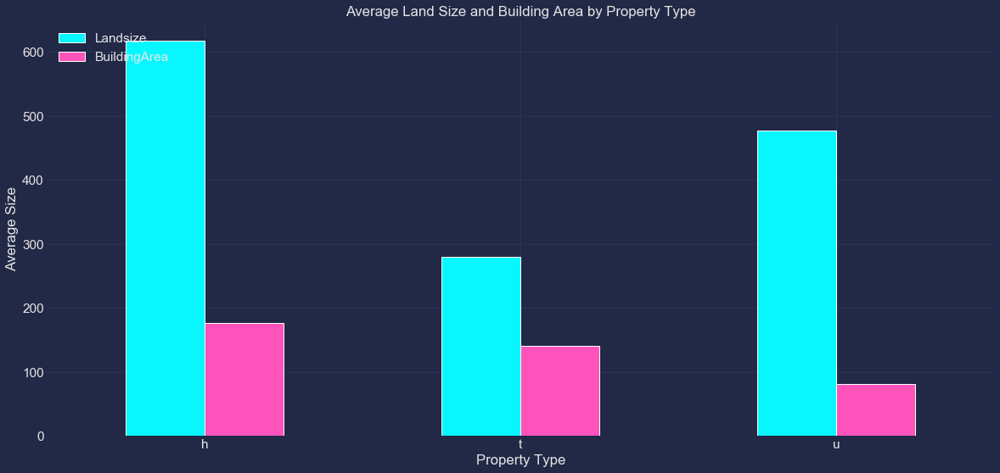

In [20]:
# Group by Property Type and calculate average land size and building area
average_sizes = df.groupby('Type')['Landsize', 'BuildingArea'].mean()

# Plot the average land size and building area
average_sizes.plot(kind='bar', figsize=(20, 9))
plt.xlabel('Property Type')
plt.ylabel('Average Size')
plt.title('Average Land Size and Building Area by Property Type')
plt.xticks(rotation=0)
plt.legend(loc='upper left')
plt.show()

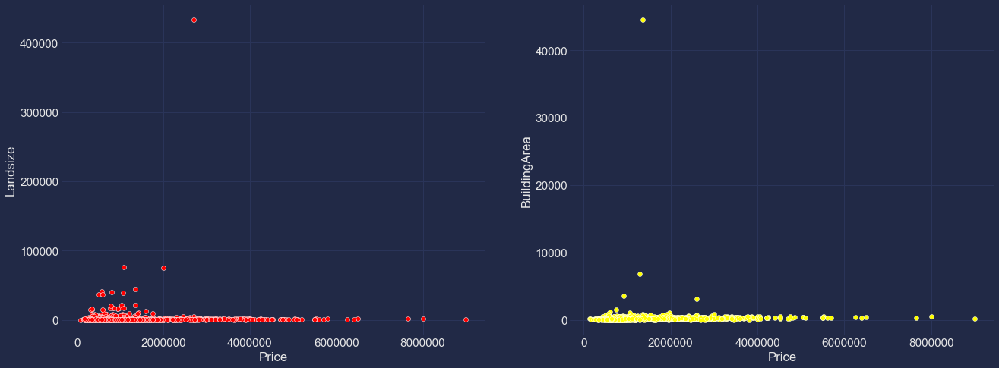

In [21]:
plt.subplots(figsize = (22, 8))
plt.subplot(1,2,1)
sns.scatterplot(x='Price', y='Landsize', data=df, color='red')

plt.subplot(1,2,2)
sns.scatterplot(x='Price', y='BuildingArea', data=df, color='yellow')

---

7. **Is there a relationship between property attributes, such as the number of bedrooms (`Bedroom2`), bathrooms (`Bathroom`), and car spaces (`Car`)?**
   - Investigate how the number of bedrooms, bathrooms, and car spaces are related.
   - Determine if certain combinations of these attributes are more common.

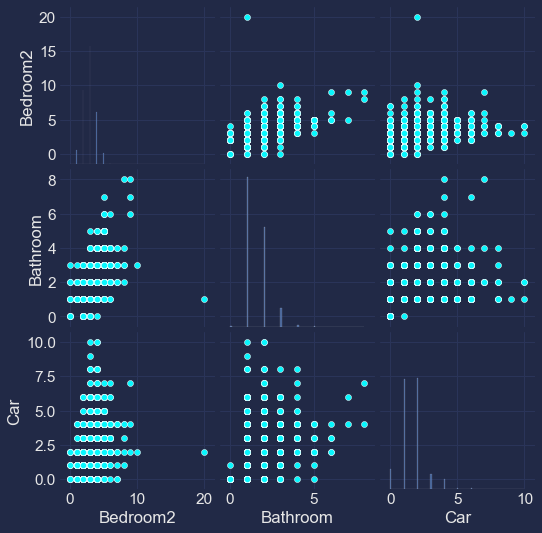

          Bedroom2  Bathroom       Car
Bedroom2  1.000000  0.584685  0.405325
Bathroom  0.584685  1.000000  0.322246
Car       0.405325  0.322246  1.000000


In [22]:
# Select the relevant columns for analysis
attributes = ['Bedroom2', 'Bathroom', 'Car']
property_data = df[attributes]

# Create a scatter matrix plot
sns.pairplot(property_data)
plt.show()

# Calculate the correlation matrix
correlation_matrix = property_data.corr()

# Display the correlation matrix
print(correlation_matrix)


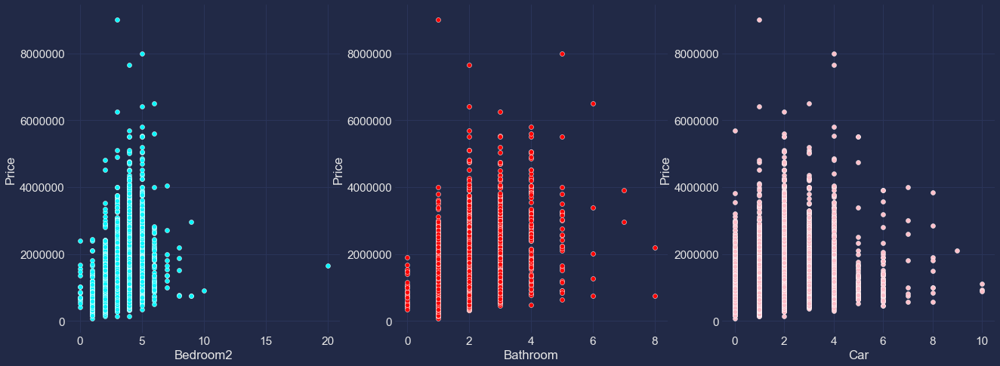

In [23]:
plt.subplots(figsize = (22, 8))

plt.subplot(1,3,1)
sns.scatterplot(x='Bedroom2', y='Price', data=df)

plt.subplot(1,3,2)
sns.scatterplot(x='Bathroom', y='Price', data=df, color='red')

plt.subplot(1,3,3)
sns.scatterplot(x='Car', y='Price', data=df, color='pink')

---

8. **Which council areas (`CouncilArea`) have the highest number of properties (`Propertycount`)?**
   - Identify the council areas with the highest property counts.
   - Analyze if property counts correlate with other factors such as location or property prices.

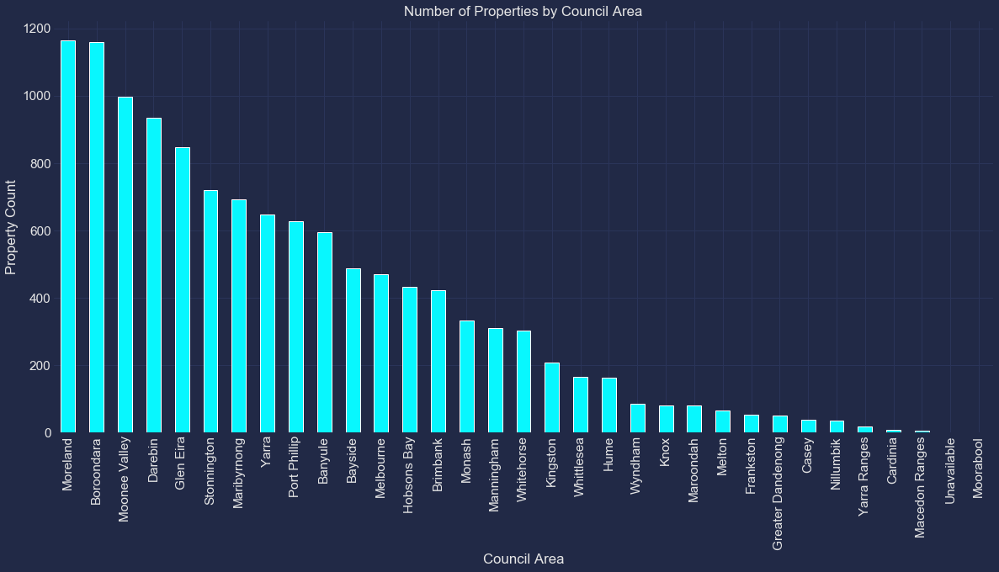

In [24]:
# Group by Council Area and count properties
property_counts = df.groupby('CouncilArea')['Propertycount'].count().sort_values(ascending=False)

# Plot the property counts
plt.figure(figsize=(20, 9))
property_counts.plot(kind='bar')
plt.xlabel('Council Area')
plt.ylabel('Property Count')
plt.title('Number of Properties by Council Area')
plt.xticks(rotation=90)
plt.show()

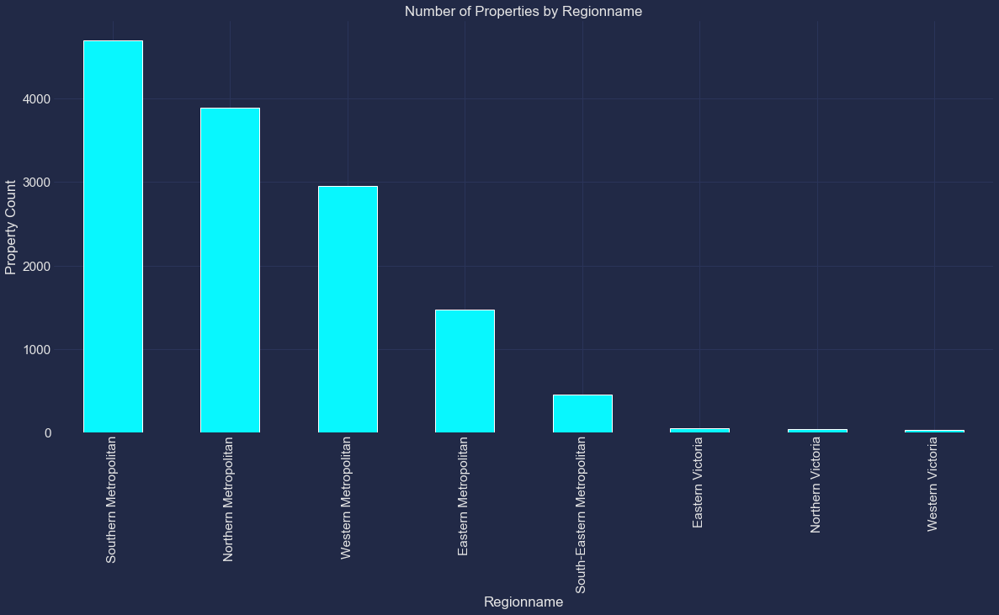

In [25]:
# Group by Council Area and count properties
property_counts = df.groupby('Regionname')['Propertycount'].count().sort_values(ascending=False)

# Plot the property counts
plt.figure(figsize=(20, 9))
property_counts.plot(kind='bar')
plt.xlabel('Regionname')
plt.ylabel('Property Count')
plt.title('Number of Properties by Regionname')
plt.xticks(rotation=90)
plt.show()

---

9. **Are there any spatial patterns in property locations (`Lattitude`, `Longtitude`) and prices (`Price`)?**
   - Visualize the property locations on a map using latitude and longitude coordinates.
   - Explore if there are any spatial patterns or clusters in property prices.

In [26]:
# Scatter plot of property locations and prices
scatter_fig = px.scatter(df, x='Longtitude', y='Lattitude', color='Price')
scatter_fig.update_layout(title='Property Locations and Prices',
                          xaxis_title='Longitude', yaxis_title='Latitude')
scatter_fig.show()

# Spatial heatmap of property prices
heatmap_fig = px.density_mapbox(df, lat='Lattitude', lon='Longtitude', z='Price',
                                radius=10, center=dict(lat=-37.8136, lon=144.9631),
                                zoom=10, mapbox_style='carto-positron')
heatmap_fig.update_layout(title='Spatial Heatmap of Property Prices')
heatmap_fig.show()

10. **How does the distance to a particular location (`Distance`) affect property prices (`Price`)?**
    - Analyze the relationship between the distance to a specific location and property prices.
    - Determine if there is a correlation or any notable patterns.

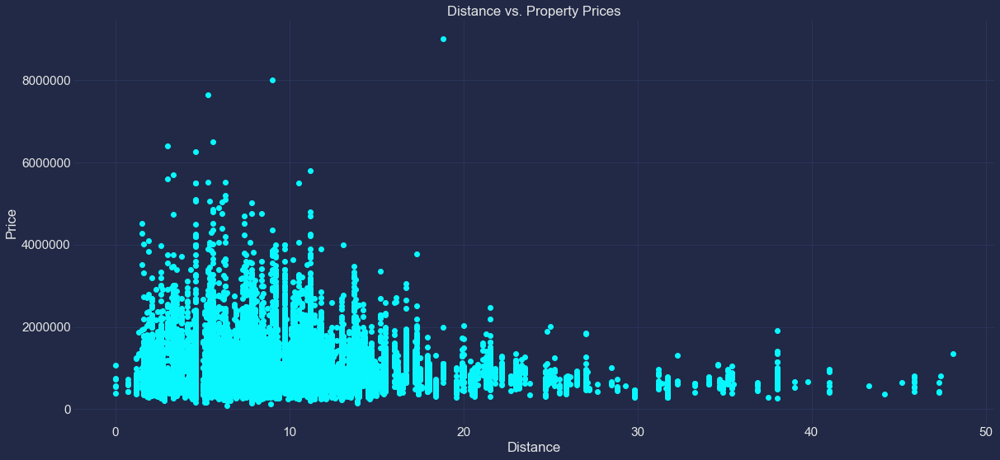

Correlation Coefficient: -0.16252183786382543


In [27]:
# Create a scatter plot or line plot of distance and property prices
plt.figure(figsize=(20, 9))
plt.scatter(df['Distance'], df['Price'])
plt.xlabel('Distance')
plt.ylabel('Price')
plt.title('Distance vs. Property Prices')
plt.show()

# Calculate the correlation coefficient
correlation_coefficient = df['Distance'].corr(df['Price'])
print('Correlation Coefficient:', correlation_coefficient)

---

## Check for Outliers

In [28]:
import numpy as np
from scipy import stats

data = np.array([1, 2, 3, 4, 5, 100])

z_scores = stats.zscore(data)
outliers = np.abs(z_scores) > 2

print(data[outliers])  # Prints the outliers


[100]


In [29]:
for i in num_feat.columns:
    fig=px.box(num_feat, y=[i])
    fig.show()

# Feature Engineering

In [30]:
# Add age variable
df['Age'] = 2017 - df['YearBuilt']

# Identify historic homes
df['Historic'] = np.where(df['Age']>=50,'Historic','Contemporary')

# Convert to Category
df['Historic'] = df['Historic'].astype('category')

In [31]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount,Age,Historic
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0,NaN,Contemporary
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0,117.0,Historic
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,...,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0,117.0,Historic
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,2017-04-03,2.5,3067.0,...,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0,NaN,Contemporary
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-04-06,2.5,3067.0,...,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0,3.0,Contemporary


### Correlational Matrix

In [32]:
corr = df.corr()
fig = px.imshow(corr, text_auto = True, aspect = 'auto')
fig.show()

# Data Cleaning

#### Impute missing data

In [33]:
df.Car=df.Car.fillna(df.Car.median())
df.BuildingArea=df.BuildingArea.fillna(df.BuildingArea.median())
df.YearBuilt=df.YearBuilt.fillna(df.YearBuilt.median())
df.Age=df.Age.fillna(df.Age.median())

In [34]:
df['CouncilArea']=df['CouncilArea'].fillna(df['CouncilArea'].value_counts().index[0])

In [35]:
df.isnull().sum()

Suburb           0
Address          0
Rooms            0
Type             0
Price            0
Method           0
SellerG          0
Date             0
Distance         0
Postcode         0
Bedroom2         0
Bathroom         0
Car              0
Landsize         0
BuildingArea     0
YearBuilt        0
CouncilArea      0
Lattitude        0
Longtitude       0
Regionname       0
Propertycount    0
Age              0
Historic         0
dtype: int64

#### Outliers handling

In [36]:
outliers=num_feat

In [37]:
for i in outliers:
    minimum,q1,middle,q3,maximum=np.quantile(df[i],[0,0.25,0.50,0.75,1])
    IQR=q3-q1
    lower_fence=q1-(IQR*1.5)
    higher_fence=q3+(IQR*1.5)
    print("In "+i+" Column any values beyond the Range "+str(lower_fence)+" and "+str(higher_fence)+" are outliers")

In Rooms Column any values beyond the Range 0.5 and 4.5 are outliers
In Price Column any values beyond the Range -370000.0 and 2350000.0 are outliers
In Distance Column any values beyond the Range -4.250000000000002 and 23.35 are outliers
In Postcode Column any values beyond the Range 2888.0 and 3304.0 are outliers
In Bedroom2 Column any values beyond the Range 0.5 and 4.5 are outliers
In Bathroom Column any values beyond the Range -0.5 and 3.5 are outliers
In Car Column any values beyond the Range -0.5 and 3.5 are outliers
In Landsize Column any values beyond the Range -534.0 and 1362.0 are outliers
In BuildingArea Column any values beyond the Range 110.09 and 141.85 are outliers
In YearBuilt Column any values beyond the Range 1937.5 and 1997.5 are outliers
In Lattitude Column any values beyond the Range -38.007456250000004 and -37.60576625 are outliers
In Longtitude Column any values beyond the Range 144.73654249999998 and 145.25136249999997 are outliers
In Propertycount Column any v

### Encode

In [38]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler

In [39]:
# drop features
drop_list = ['Suburb', 'Address', 'SellerG', 'CouncilArea']
df = df.drop(drop_list, axis=1)

In [40]:
df[['Type', 'Method', 'Regionname']].isna().sum()

Type          0
Method        0
Regionname    0
dtype: int64

In [41]:
# one-hot encoding
# set sparse=False to return an array
cat_encoder = OneHotEncoder(sparse=False)
df_type_reshaped = df['Type'].values.reshape(-1,1)
df_type_1hot = cat_encoder.fit_transform(df_type_reshaped)
categories = cat_encoder.categories_
df_type_1hot = pd.DataFrame(df_type_1hot, columns=categories)

# concat 1hot DataFrame w/ df_na
# reset index of df_na and concat
df = df.reset_index().drop('index', axis=1)
df = pd.concat([df, df_type_1hot], axis=1)
df.head()

,Rooms,Type,Price,Method,Date,Distance,Postcode,Bedroom2,Bathroom,Car,...,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount,Age,Historic,"(h,)","(t,)","(u,)"
0,2,h,1480000.0,S,2016-03-12,2.5,3067.0,2.0,1.0,1.0,...,1970.0,-37.7996,144.9984,Northern Metropolitan,4019.0,47.0,Contemporary,1.0,0.0,0.0
1,2,h,1035000.0,S,2016-04-02,2.5,3067.0,2.0,1.0,0.0,...,1900.0,-37.8079,144.9934,Northern Metropolitan,4019.0,117.0,Historic,1.0,0.0,0.0
2,3,h,1465000.0,SP,2017-04-03,2.5,3067.0,3.0,2.0,0.0,...,1900.0,-37.8093,144.9944,Northern Metropolitan,4019.0,117.0,Historic,1.0,0.0,0.0
3,3,h,850000.0,PI,2017-04-03,2.5,3067.0,3.0,2.0,1.0,...,1970.0,-37.7969,144.9969,Northern Metropolitan,4019.0,47.0,Contemporary,1.0,0.0,0.0
4,4,h,1600000.0,VB,2016-04-06,2.5,3067.0,3.0,1.0,2.0,...,2014.0,-37.8072,144.9941,Northern Metropolitan,4019.0,3.0,Contemporary,1.0,0.0,0.0


In [42]:
# one-hot encode 'Method' feature
df_meth_reshaped = df['Method'].values.reshape(-1,1)
df_meth_1hot = cat_encoder.fit_transform(df_meth_reshaped)
categories = cat_encoder.categories_
df_meth_1hot = pd.DataFrame(df_meth_1hot, columns=categories)

# concat 1hot DataFrame w/ df_na
df = pd.concat([df, df_meth_1hot], axis=1)
df.head()

,Rooms,Type,Price,Method,Date,Distance,Postcode,Bedroom2,Bathroom,Car,...,Age,Historic,"(h,)","(t,)","(u,)","(PI,)","(S,)","(SA,)","(SP,)","(VB,)"
0,2,h,1480000.0,S,2016-03-12,2.5,3067.0,2.0,1.0,1.0,...,47.0,Contemporary,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2,h,1035000.0,S,2016-04-02,2.5,3067.0,2.0,1.0,0.0,...,117.0,Historic,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,3,h,1465000.0,SP,2017-04-03,2.5,3067.0,3.0,2.0,0.0,...,117.0,Historic,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,3,h,850000.0,PI,2017-04-03,2.5,3067.0,3.0,2.0,1.0,...,47.0,Contemporary,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,4,h,1600000.0,VB,2016-04-06,2.5,3067.0,3.0,1.0,2.0,...,3.0,Contemporary,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [43]:
# one-hot encode 'Regionname' feature
df_reg_reshaped = df['Regionname'].values.reshape(-1,1)
df_reg_1hot = cat_encoder.fit_transform(df_reg_reshaped)
categories = cat_encoder.categories_
df_reg_1hot = pd.DataFrame(df_reg_1hot, columns=categories)

# concat 1hot DataFrame w/ df_na
df = pd.concat([df, df_reg_1hot], axis=1)
df.head()

,Rooms,Type,Price,Method,Date,Distance,Postcode,Bedroom2,Bathroom,Car,...,"(SP,)","(VB,)","(Eastern Metropolitan,)","(Eastern Victoria,)","(Northern Metropolitan,)","(Northern Victoria,)","(South-Eastern Metropolitan,)","(Southern Metropolitan,)","(Western Metropolitan,)","(Western Victoria,)"
0,2,h,1480000.0,S,2016-03-12,2.5,3067.0,2.0,1.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2,h,1035000.0,S,2016-04-02,2.5,3067.0,2.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,3,h,1465000.0,SP,2017-04-03,2.5,3067.0,3.0,2.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3,h,850000.0,PI,2017-04-03,2.5,3067.0,3.0,2.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,4,h,1600000.0,VB,2016-04-06,2.5,3067.0,3.0,1.0,2.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [44]:
# drop features
drop_list2 = ['Type', 'Method', 'Regionname', 'Date', 'Historic']
df = df.drop(drop_list2, axis=1)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 30 columns):
Rooms                            13580 non-null int64
Price                            13580 non-null float64
Distance                         13580 non-null float64
Postcode                         13580 non-null float64
Bedroom2                         13580 non-null float64
Bathroom                         13580 non-null float64
Car                              13580 non-null float64
Landsize                         13580 non-null float64
BuildingArea                     13580 non-null float64
YearBuilt                        13580 non-null float64
Lattitude                        13580 non-null float64
Longtitude                       13580 non-null float64
Propertycount                    13580 non-null float64
Age                              13580 non-null float64
(h,)                             13580 non-null float64
(t,)                             13580 non-null float

---

# Pre- process & Build Model

In [46]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [47]:
# Apply the pipeline to dataset
X = df.drop('Price', axis=1)
y = np.log(df['Price']) #normalize dependent variable 

In [48]:
from scipy.stats import mstats

lower_percentile = 0.00
upper_percentile = 0.10

# Perform winsorization
X_winsorized = mstats.winsorize(X, limits=(lower_percentile/100, upper_percentile/100))

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X_winsorized, y, test_size=0.2, random_state=42)

In [50]:
# Define the models to train
models = {
    "Linear Regression": LinearRegression(),
    "Lasso Regression": Lasso(),
    "Ridge Regression": Ridge(),
    "Elastic Net Regression": ElasticNet()
}

In [51]:
# Define the scalers, feature selection, and other preprocessing steps
preprocessors = [
    ("StandardScaler", StandardScaler()),
    ("MinMaxScaler", StandardScaler()),
    ("PolynomialFeatures", PolynomialFeatures()),
    ("FeatureSelection", SelectKBest(f_regression))
]

In [52]:
# Perform the regressions with different preprocessing steps
for preprocessor_name, preprocessor in preprocessors:
    print(f"Preprocessor: {preprocessor_name}")
    for model_name, model in models.items():
        # Create a pipeline with the preprocessing steps and model
        pipeline = Pipeline([
            ('preprocessor', preprocessor),
            ('model', model)
        ])
        
        # Define hyperparameters for grid search (if applicable)
        param_grid = {}
        if preprocessor_name == "FeatureSelection" and model_name != "Linear Regression":
            param_grid = {
                'preprocessor__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,]  # Adjust the number of selected features as needed
                }
        
        # Perform grid search with cross-validation
        cv = KFold(n_splits=3, shuffle=True, random_state=42)
        
        grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid,  scoring='r2', cv=cv)
        grid_search.fit(X_train, y_train)
        
        # Evaluate the model
        y_pred = grid_search.predict(X_test)
        score = r2_score(y_test, y_pred)
        print(f"{model_name}: R^2 score = {score:.3f}")
        
        # Print the best hyperparameters (if applicable)
        if preprocessor_name == "FeatureSelection" and model_name != "Linear Regression":
            print(f"Best number of features selected: {grid_search.best_params_['preprocessor__k']}")
            
    print()

Preprocessor: StandardScaler
Linear Regression: R^2 score = 0.726
Lasso Regression: R^2 score = -0.000
Ridge Regression: R^2 score = 0.726
Elastic Net Regression: R^2 score = -0.000

Preprocessor: MinMaxScaler
Linear Regression: R^2 score = 0.726
Lasso Regression: R^2 score = -0.000
Ridge Regression: R^2 score = 0.726
Elastic Net Regression: R^2 score = -0.000

Preprocessor: PolynomialFeatures
Linear Regression: R^2 score = 0.755
Lasso Regression: R^2 score = 0.591
Ridge Regression: R^2 score = 0.735
Elastic Net Regression: R^2 score = 0.596

Preprocessor: FeatureSelection
Linear Regression: R^2 score = 0.587
Lasso Regression: R^2 score = 0.067
Best number of features selected: 8
Ridge Regression: R^2 score = 0.726
Best number of features selected: 23
Elastic Net Regression: R^2 score = 0.066
Best number of features selected: 8



# Validation

In [53]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer, mean_squared_error, mean_absolute_error

In [54]:
# Define the evaluation metrics
evaluation_metrics = {
    "R-squared": "r2",
    "MSE": make_scorer(mean_squared_error, greater_is_better=False),
    "RMSE": make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False),
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False)
}

# Perform cross-validation and calculate evaluation metrics for each model
results = {}

for model_name, model in models.items():
    scores = cross_validate(model, X, y, cv=5, scoring=evaluation_metrics)
    avg_scores = {metric: np.mean(scores[f"test_{metric}"]) for metric in evaluation_metrics}
    results[model_name] = avg_scores

# Print the results
for model_name, metrics in results.items():
    print(model_name)
    for metric, score in metrics.items():
        print(f"{metric}: {score}")
    print()

Linear Regression
R-squared: 0.6650591975127078
MSE: -0.09061434342224906
RMSE: -0.2988826306238074
MAE: -0.21834269741076157

Lasso Regression
R-squared: -0.9648362300698773
MSE: -0.5152448881863892
RMSE: -0.6554995875641663
MAE: -0.4018586787384416

Ridge Regression
R-squared: 0.6661494551454676
MSE: -0.09034861655931894
RMSE: -0.29854640370230623
MAE: -0.21820415005326166

Elastic Net Regression
R-squared: -1.03466327496526
MSE: -0.532575097515784
RMSE: -0.6616962787217502
MAE: -0.39991312061362316

